In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import pylab

In [3]:
import sys 
sys.path.insert(1, '/data/workspace_files/')

In [4]:
import econometrics

In [5]:
%reload_ext autoreload
%autoreload 2

## Trade identified pairs

In [6]:
data_path = "/data/workspace_files/"
df = pd.read_csv("/data/workspace_files/main_data.csv")

In [7]:
performance_df = pd.read_csv("/data/workspace_files/rahul_pair_performance.csv")

In [8]:
# Create figure and subplot manually
# fig = plt.figure()
# host = fig.add_subplot(111)

# More versatile wrapper
def plot_triple_curves(S1,S2, S3,xlabel, ylabel, zlabel, S1_label, S2_label, S3_label):
    fig, host = plt.subplots(figsize=(25,12)) # (width, height) in inches
    
    common_datelist = econometrics.get_common_dates(S2,S3)
    S1 = S1[S1.index.isin(common_datelist)]
    S2 = S2[S2.index.isin(common_datelist)]
    S3 = S3[S3.index.isin(common_datelist)]

    #print(S1)
    #print(S2)
    print(S3)
    par1 = host.twinx()
    par2 = host.twinx()
    

    host.set_xlabel(xlabel)
    host.set_ylabel(S3_label)
    par1.set_ylabel(S1_label)
    par2.set_ylabel(S2_label)
    #plt.xticks(rotation=-90, fontsize=15)

    color1 = plt.cm.viridis(0)
    color2 = plt.cm.viridis(0.5)
    color3 = plt.cm.viridis(.9)

    p1, = host.plot(S3.index, S3.values, color=color1, label=S3_label)
    p2, = par1.plot(S1.index, S1.values, color=color2, label=S1_label)
    p3, = par2.plot(S2.index, S2.values, color=color3, label=S2_label)

    lns = [p1, p2, p3]
    host.legend(handles=lns, loc='best')

In [9]:
## Trade individual pairs
rahul_pair = [('FB', 'GOOG'),
 ('KBH', 'TOL'),
 ('DHI', 'LEN'),
 ('CL', 'PG'),
 ('HAL', 'SLB'),
 ('CVX', 'XOM'),
 ('CSX', 'NSC'),
 ('ITT', 'PH'),
 ('TKR', 'URI'),
 ('RTX', 'WWD'),
 ('LRCX', 'MKSI'),
 ('ADI', 'MCHP'),
 ('QRVO', 'SWKS'),
 ('IP', 'WRK'),
 ('CE', 'EMN'),
 ('CDE', 'HL'),
 ('NUE', 'STLD'),
 ('CC', 'TROX'),
 ('IVV', 'SPY'),
 ('IWF', 'VUG'),
 ('RYN', 'WY')]

In [10]:

rahul_pair_remaining = [('CVX', 'XOM'),
 ('CSX', 'NSC'),
 ('ITT', 'PH'),
 ('TKR', 'URI'),
 ('RTX', 'WWD'),
 ('LRCX', 'MKSI'),
 ('ADI', 'MCHP'),
 ('QRVO', 'SWKS'),
 ('IP', 'WRK'),
 ('CE', 'EMN'),
 ('CDE', 'HL'),
 ('NUE', 'STLD'),
 ('CC', 'TROX'),
 ('IVV', 'SPY'),
 ('IWF', 'VUG'),
 ('RYN', 'WY')]

## FB-GOOG pair
Facebook and Google

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

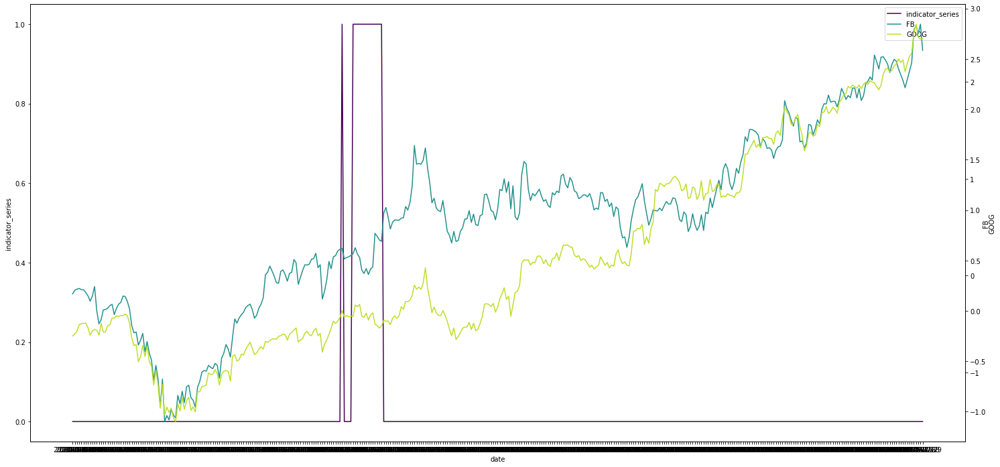

In [62]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "FB","5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "GOOG","5. adjusted close", "2019-01-01","2021-07-31"))

results_df, _ = econometrics.generate_coint_performance_df(df, [('FB', 'GOOG')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df[results_df["pair"]=="FB~GOOG"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "FB", "GOOG", "indicator_series")

## KBH-TOL Pair
KB Home and Toll Brothers Inc. both are home building companies.

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

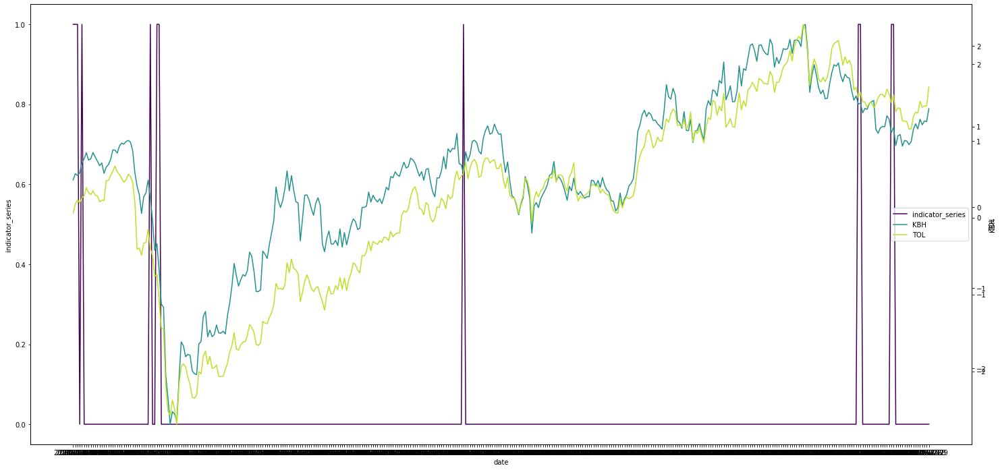

In [61]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "KBH","5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "TOL","5. adjusted close", "2019-01-01","2021-07-31"))

results_df, _ = econometrics.generate_coint_performance_df(df, [('KBH', 'TOL')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df[results_df["pair"]=="KBH~TOL"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "KBH", "TOL", "indicator_series")

## DHI-LEN Pair
DR Horton Inc. and Lennar Construction are both home constructions companies

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

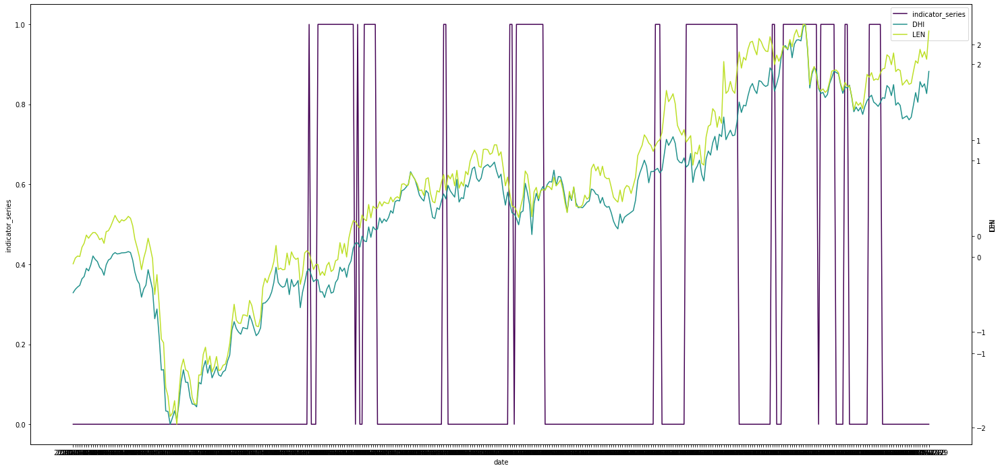

In [63]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "DHI","5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "LEN","5. adjusted close", "2019-01-01","2021-07-31"))

results_df, _ = econometrics.generate_coint_performance_df(df, [('DHI', 'LEN')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df[results_df["pair"]=="DHI~LEN"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "DHI", "LEN", "indicator_series")

## CL-PG Pair
Colgate-Palmolive and Proctor & Gamble company are both multinational consumer goods companies.

            is_coint
end_date            
2020-01-14         0
2020-01-15         0
2020-01-16         0
2020-01-17         0
2020-01-21         0
...              ...
2021-07-23         0
2021-07-26         0
2021-07-27         0
2021-07-28         0
2021-07-29         0

[389 rows x 1 columns]


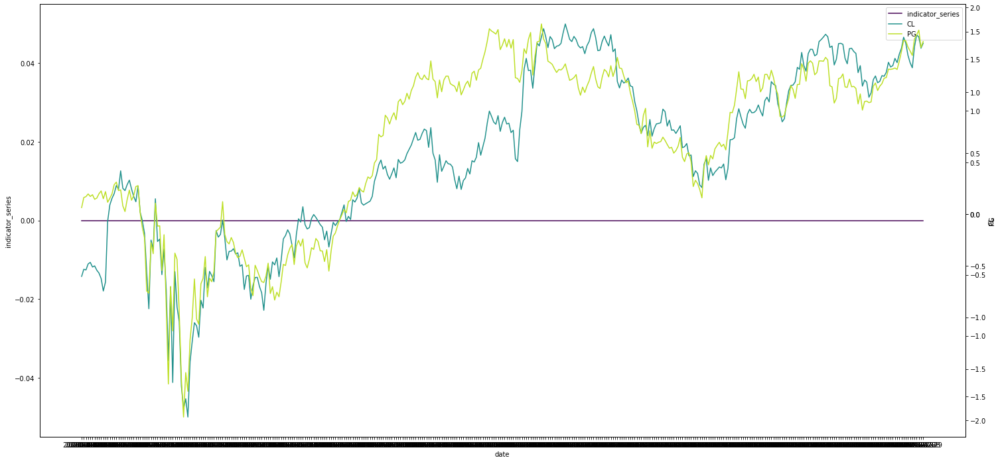

In [58]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "CL","5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "PG","5. adjusted close", "2019-01-01","2021-07-31"))

results_df, _ = econometrics.generate_coint_performance_df(df, [('CL', 'PG')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df[results_df["pair"]=="CL~PG"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "CL", "PG", "indicator_series")

## HAL-SLB Pair

Halliburton and Schlumberger are both oilfield/energy services companies.

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

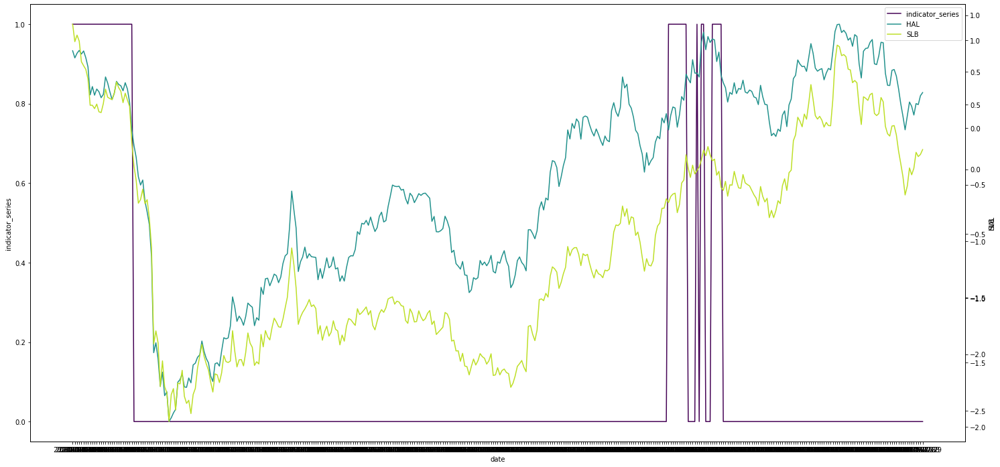

In [65]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "HAL","5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "SLB","5. adjusted close", "2019-01-01","2021-07-31"))

results_df, _ = econometrics.generate_coint_performance_df(df, [('HAL', 'SLB')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df[results_df["pair"]=="HAL~SLB"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "HAL", "SLB", "indicator_series")

Cointegration test base with linear trend, pvalue =  0.2299514308974015
Cointegration test base with quadratic trend, pvalue =  0.46172201041590727
Cointegration test base with no trend, pvalue =  0.07053375894287196
Cointegration test base with constant trend, pvalue =  0.20469814192800023
Cointegration test base with linear trend, pvalue =  0.20469814192800023
Cointegration test base with quadratic trend, pvalue =  0.4878947397530054
Cointegration test base with no trend, pvalue =  0.06007878071191135
Cointegration test base with constant trend, pvalue =  0.17813193177443387
Cointegration test base with linear trend, pvalue =  0.17813193177443387
Cointegration test base with quadratic trend, pvalue =  0.48614684611204384
Cointegration test base with no trend, pvalue =  0.05001145644480601
Cointegration test base with constant trend, pvalue =  0.17169811199959273
Cointegration test base with linear trend, pvalue =  0.17169811199959273
Cointegration test base with quadratic trend, pval

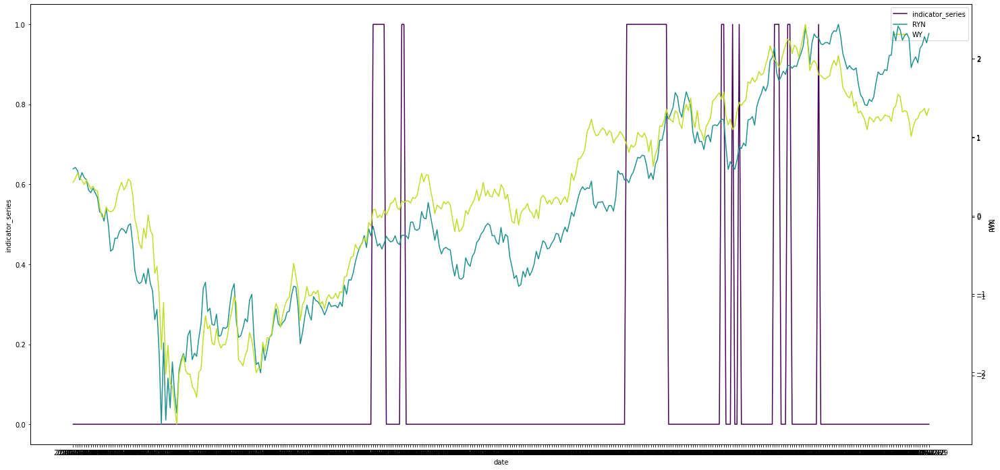

In [74]:
for pair in rahul_pair_remaining:
    X = econometrics.normalize_price(econometrics.extract_time_series(df, pair[0], "5. adjusted close", "2019-01-01","2021-07-31"))
    Y = econometrics.normalize_price(econometrics.extract_time_series(df, pair[1], "5. adjusted close", "2019-01-01","2021-07-31"))

    results_df, _ = econometrics.generate_coint_performance_df(df, [(pair[0], pair[1])], "2019-01-01","2021-07-31", threshold=0.1)

    indicator_series = results_df[results_df["pair"]==pair[0]+"~"+pair[1]][["end_date", "is_coint"]].set_index("end_date")
    plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", pair[0], pair[1], "indicator_series")

## More potential pairs

### Communications
#### NFLX-FB Pair
Netflix and Facebook

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

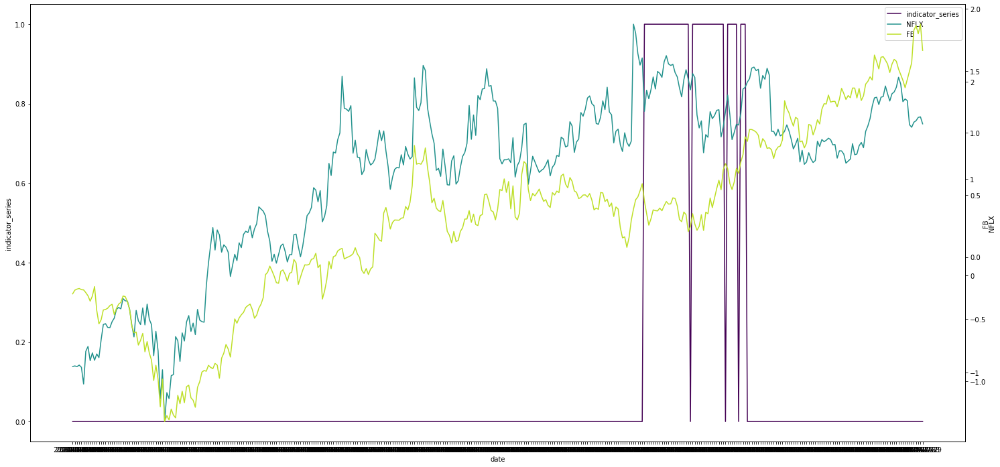

In [17]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "NFLX", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "FB", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('NFLX', 'FB')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="NFLX~FB"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "NFLX", "FB", "indicator_series")

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

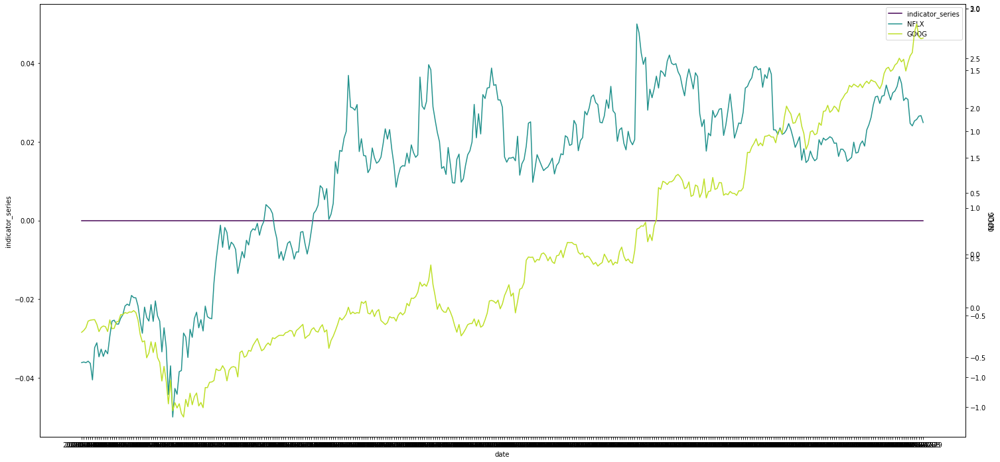

In [18]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "NFLX", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "GOOG", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('NFLX', 'GOOG')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="NFLX~GOOG"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "NFLX", "GOOG", "indicator_series")

### Consumer Discretionary
#### LEA-MGA Pair
Lear Corporation is an American company that manufactures automotive seating and automotive electrical systems. Magna International Inc. is a Canadian mobility technology company for automakers.  

#### EXPE-BKNG Pair
Expedia Group, Inc. is an American online travel shopping company for consumer and small business travel. Booking Holdings Inc. is an American travel technology company.

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

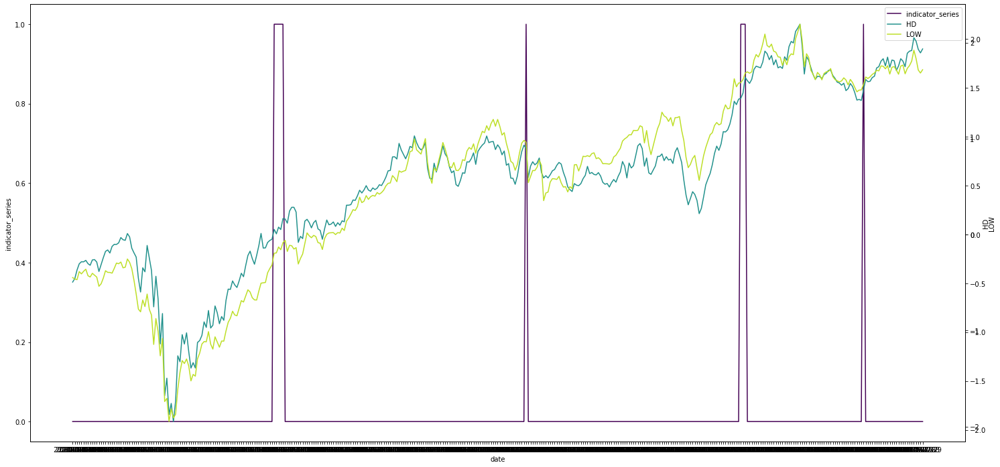

In [75]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "HD", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "LOW", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('HD', 'LOW')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="HD~LOW"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "HD", "LOW", "indicator_series")

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

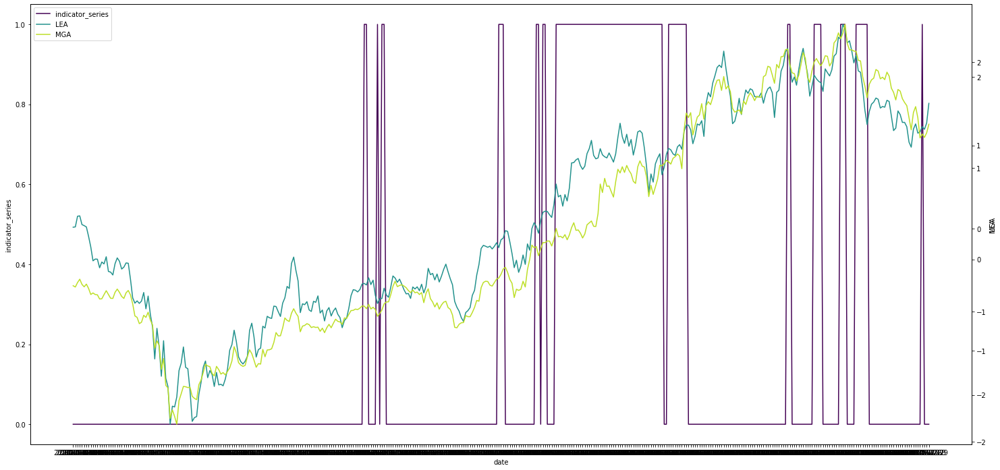

In [76]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "LEA", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "MGA", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('LEA', 'MGA')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="LEA~MGA"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "LEA", "MGA", "indicator_series")

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

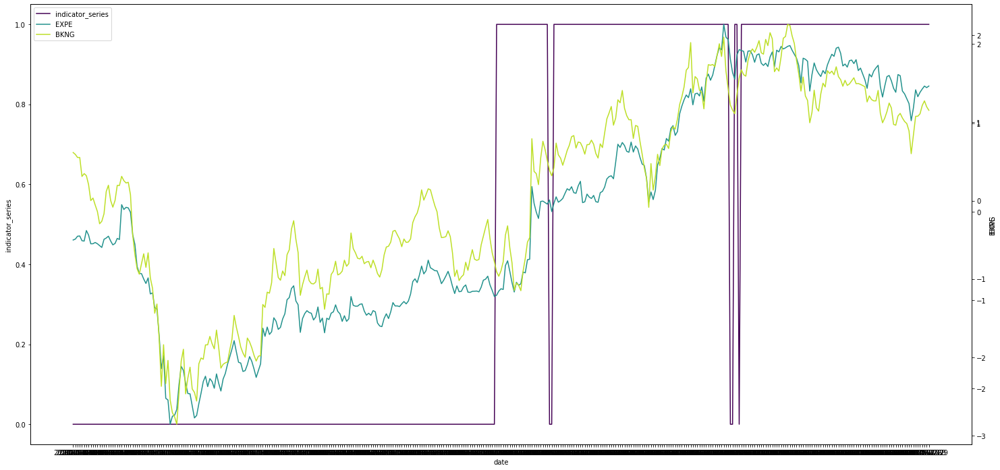

In [77]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "EXPE", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "BKNG", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('EXPE', 'BKNG')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="EXPE~BKNG"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "EXPE", "BKNG", "indicator_series")

### Consumer staples
#### HRL-CPB Pair
Hormel Foods Corporation manufactures and markets consumer-branded meat and food products.
Campbell Soup Company, doing business as Campbell's, is an American processed food and snack company.

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

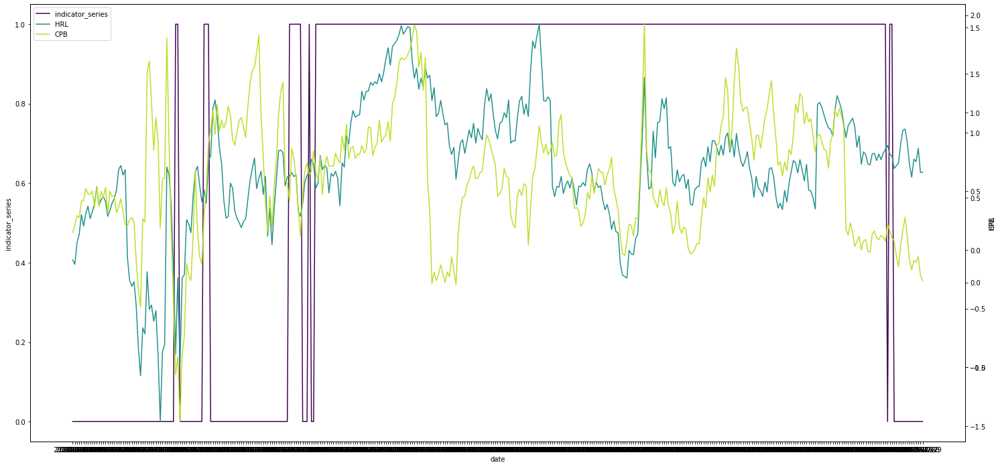

In [78]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "HRL", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "CPB", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('HRL', 'CPB')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="HRL~CPB"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "HRL", "CPB", "indicator_series")

### Energy
#### OII-WHD Pair
Oceaneering International, Inc. is a subsea engineering and applied technology company based in Houston, Texas, U.S. that provides engineered services and hardware to customers who operate in marine, space, and other environments. Cactus Wellhead is the leading manufacturer of pressure control equipment used during drilling, completion and production operations onshore and offshore. 

#### PTEN-HP Pair

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

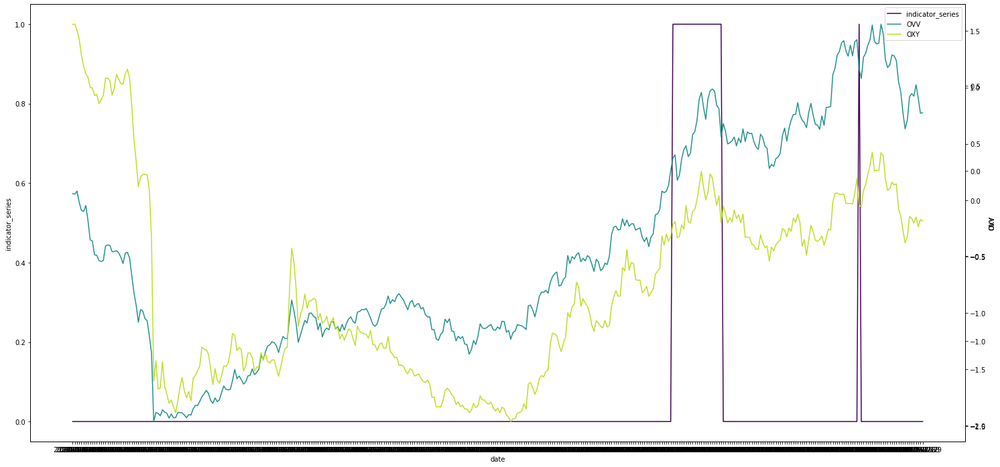

In [79]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "OVV", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "OXY", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('OVV', 'OXY')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="OVV~OXY"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "OVV", "OXY", "indicator_series")

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

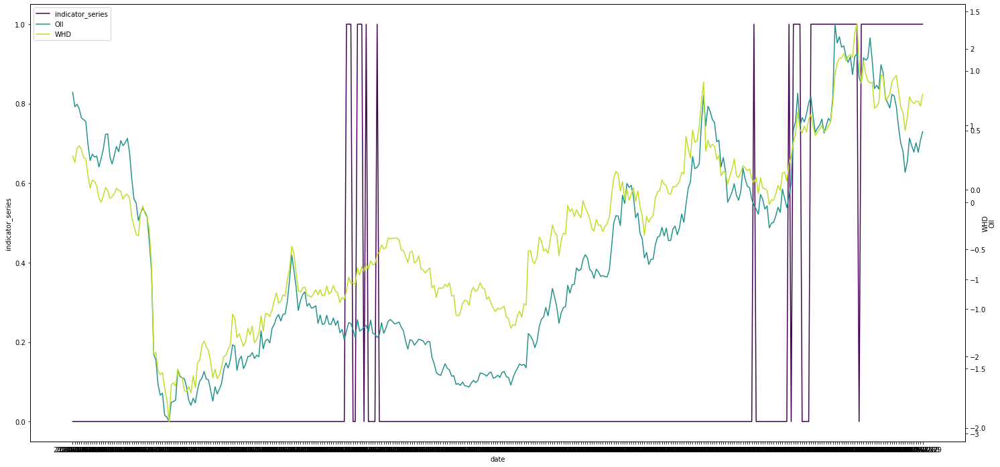

In [80]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "OII", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "WHD", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('OII', 'WHD')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="OII~WHD"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "OII", "WHD", "indicator_series")

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

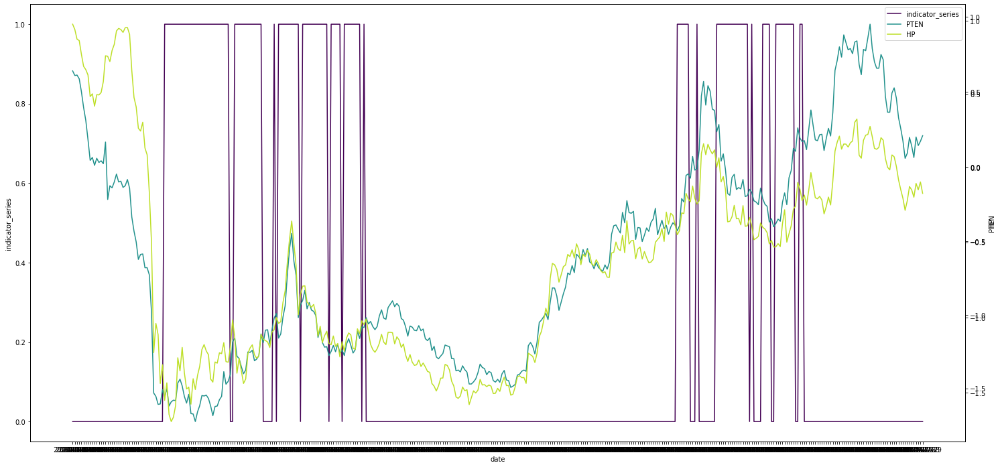

In [16]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "PTEN", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "HP", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('PTEN', 'HP')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="PTEN~HP"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "PTEN", "HP", "indicator_series")

### Industrials
#### GGG-NDSN Pair
Graco is an American manufacturer of fluid-handling systems and products. Nordson Corporation is an American multinational corporation that designs and manufactures dispensing equipment for consumer and industrial adhesives, sealants and coatings.

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

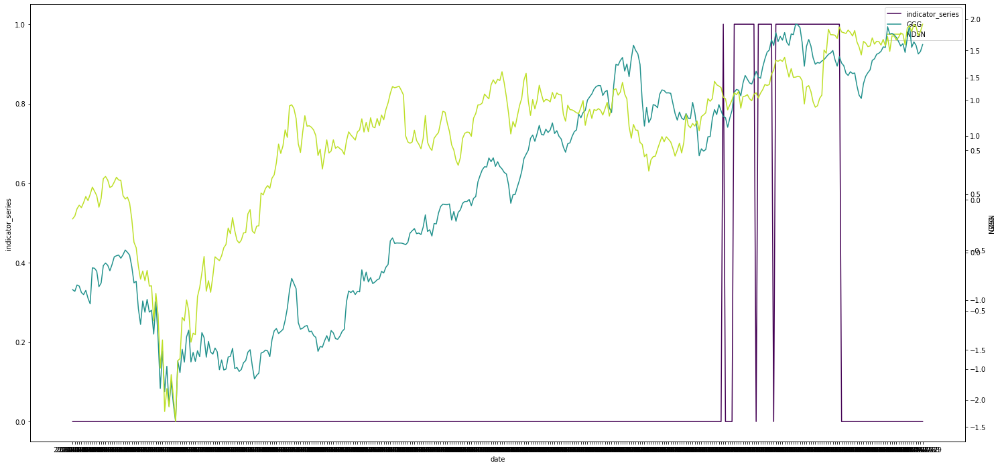

In [82]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "GGG", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "NDSN", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('GGG', 'NDSN')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="GGG~NDSN"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "GGG", "NDSN", "indicator_series")

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

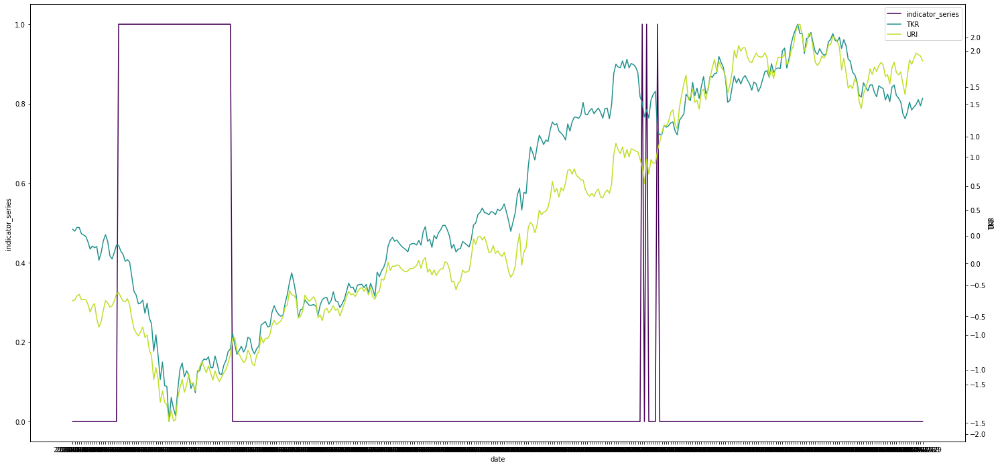

In [19]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "TKR", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "URI", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('TKR', 'URI')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="TKR~URI"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "TKR", "URI", "indicator_series")

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

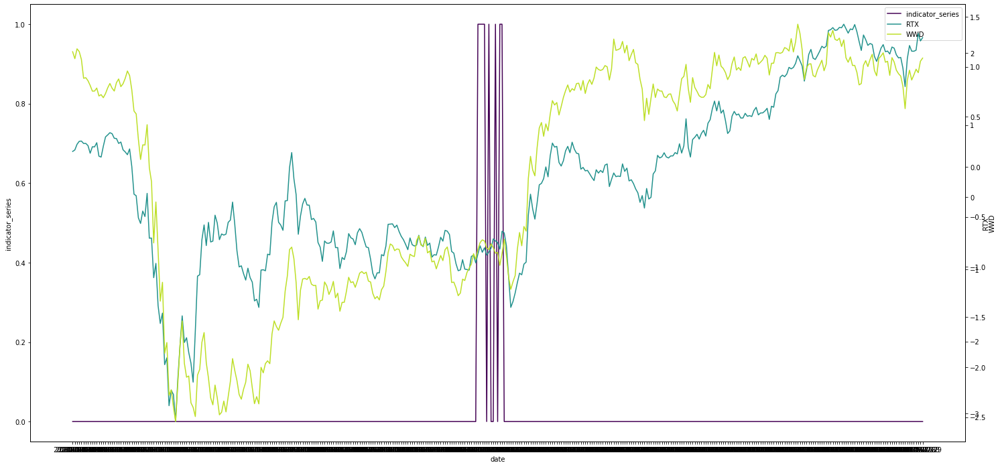

In [20]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "RTX", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "WWD", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('RTX', 'WWD')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="RTX~WWD"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "RTX", "WWD", "indicator_series")

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

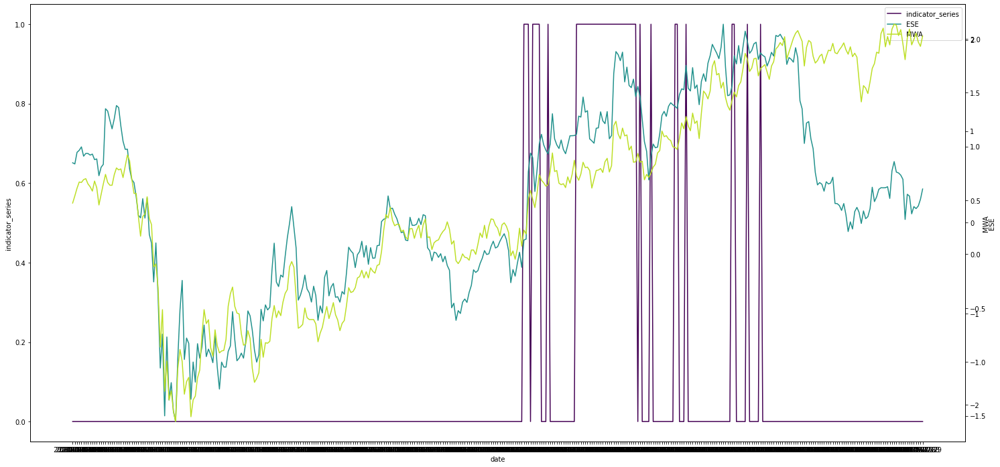

In [21]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "ESE", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "MWA", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('ESE', 'MWA')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="ESE~MWA"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "ESE", "MWA", "indicator_series")

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

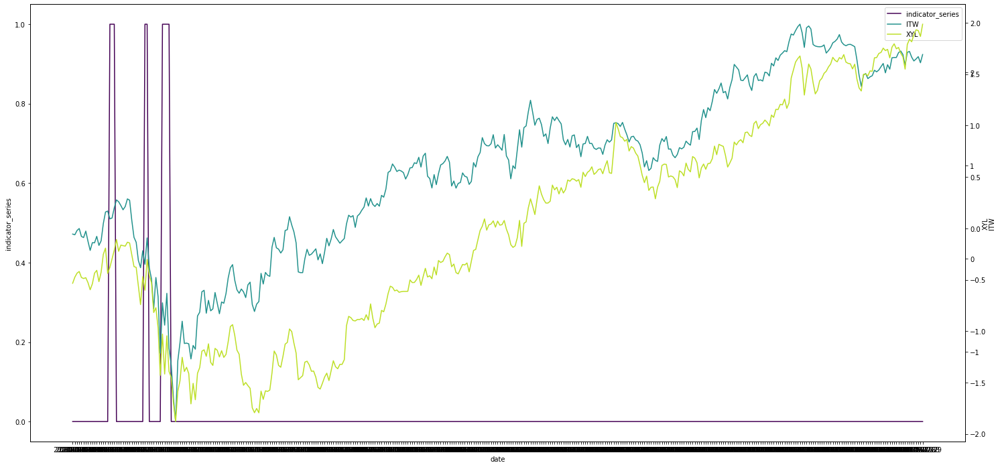

In [22]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "ITW", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "XYL", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('ITW', 'XYL')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="ITW~XYL"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "ITW", "XYL", "indicator_series")

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

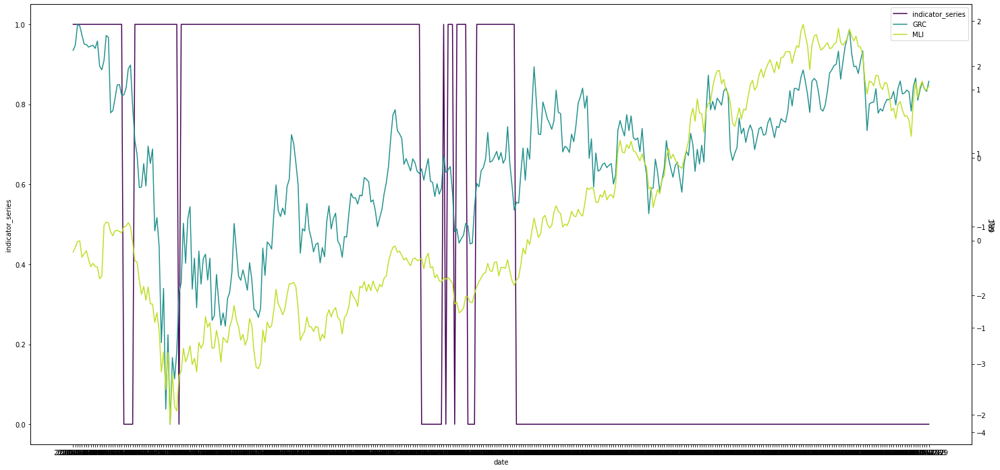

In [23]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "GRC", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "MLI", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('GRC', 'MLI')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="GRC~MLI"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "GRC", "MLI", "indicator_series")

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

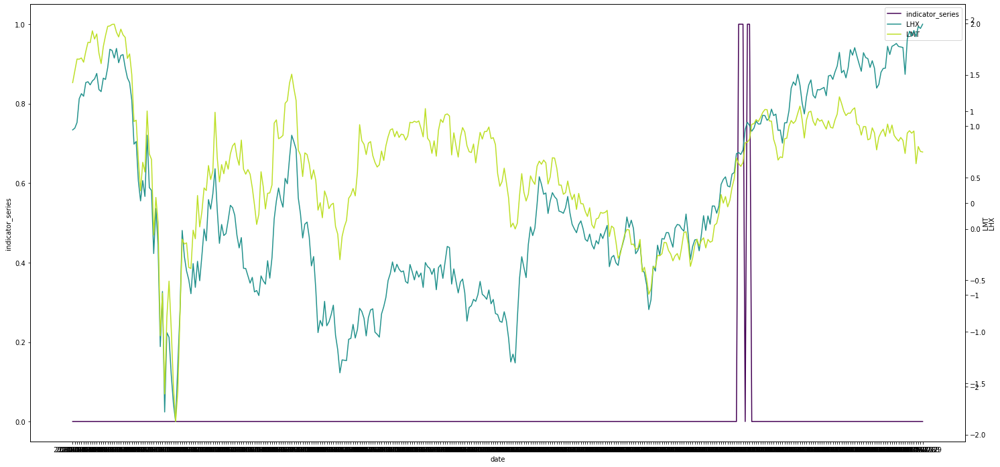

In [24]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "LHX", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "LMT", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('LHX', 'LMT')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="LHX~LMT"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "LHX", "LMT", "indicator_series")

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

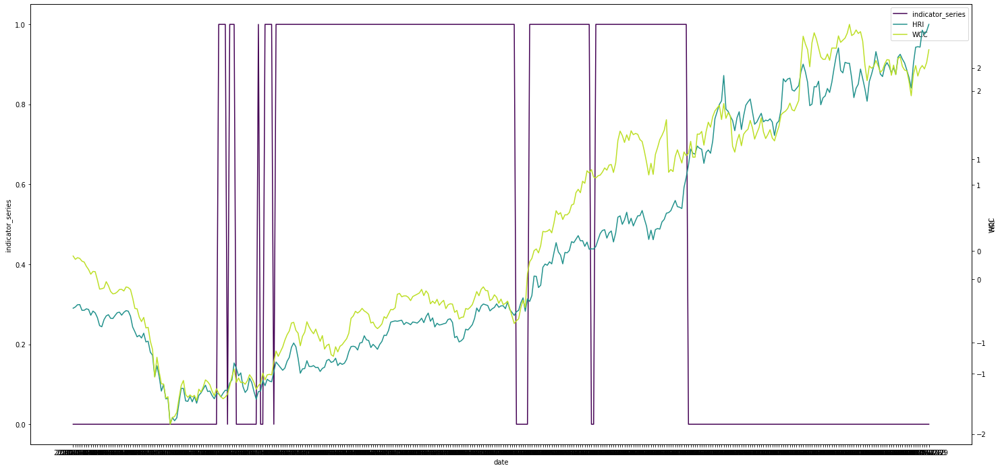

In [25]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "HRI", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "WCC", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('HRI', 'WCC')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="HRI~WCC"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "HRI", "WCC", "indicator_series")

### IT
#### ON-NXPI Pair
ON Semiconductor is a semiconductor supplier company. NXP Semiconductors N.V. is a Dutch semiconductor manufacturer.

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

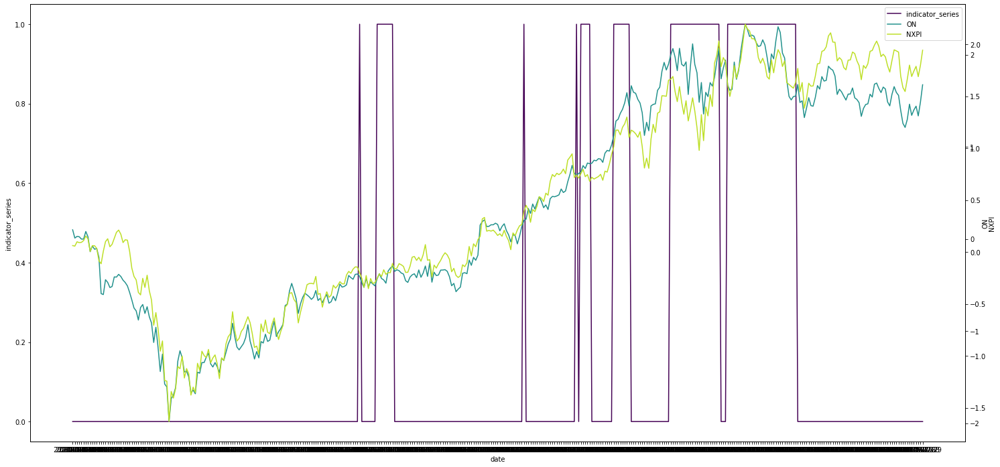

In [83]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "ON", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "NXPI", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('ON', 'NXPI')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="ON~NXPI"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "ON", "NXPI", "indicator_series")

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

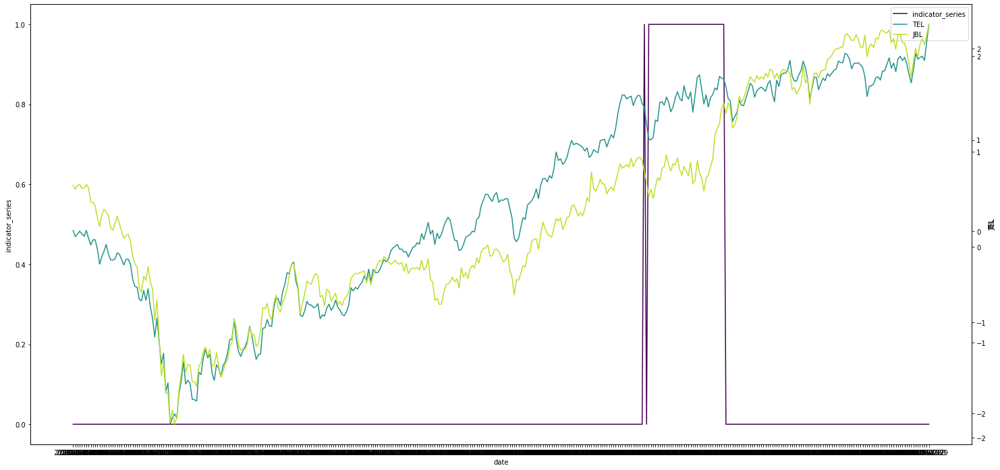

In [84]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "TEL", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "JBL", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('TEL', 'JBL')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="TEL~JBL"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "TEL", "JBL", "indicator_series")

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

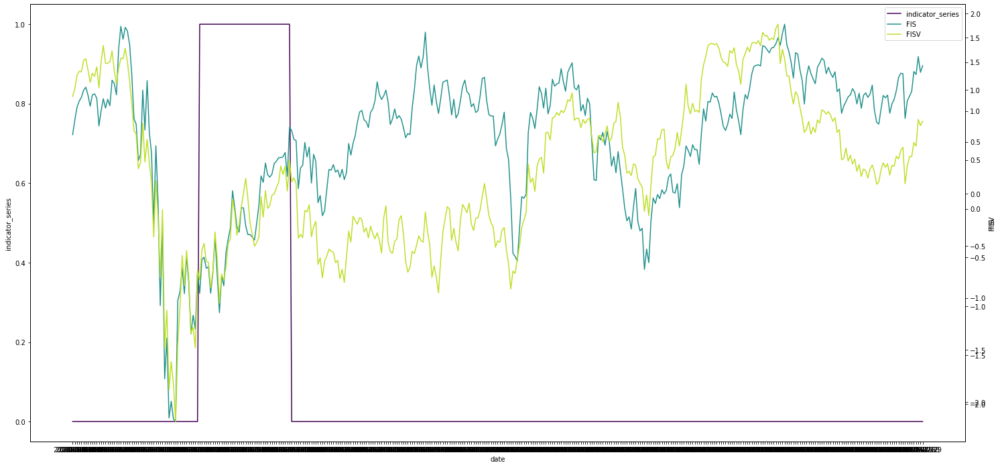

In [85]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "FIS", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "FISV", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('FIS', 'FISV')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="FIS~FISV"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "FIS", "FISV", "indicator_series")

### Materials
#### SCCO-FCX Pair
Southern Copper Corporation is a mining company that was founded in 1952. Freeport-McMoRan Inc., often called Freeport, is an American mining company.

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

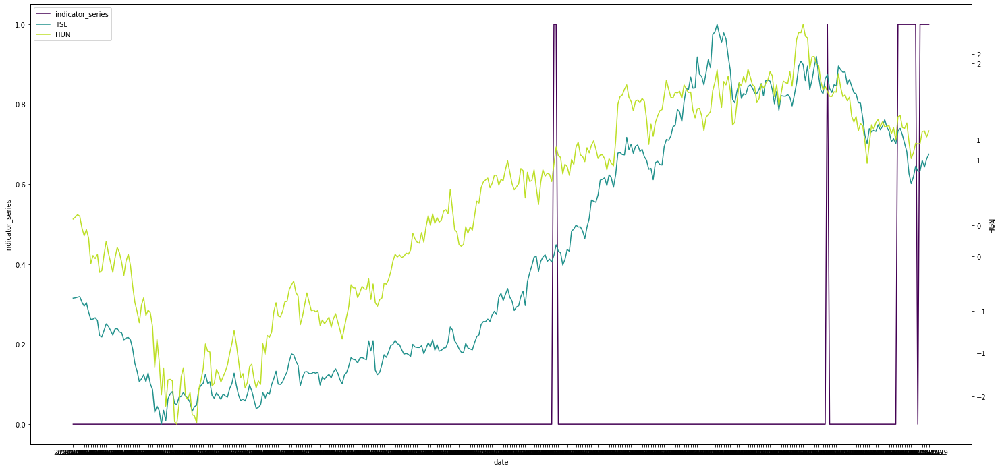

In [88]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "TSE", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "HUN", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('TSE', 'HUN')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="TSE~HUN"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "TSE", "HUN", "indicator_series")

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

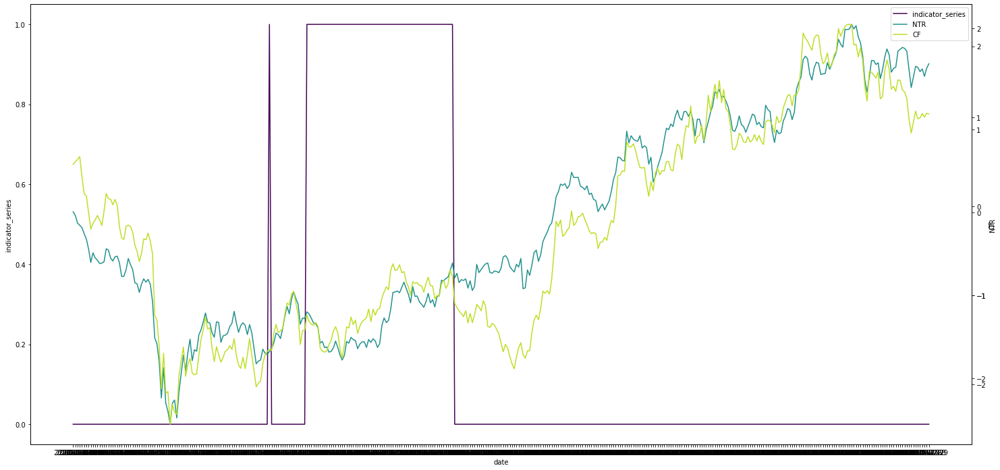

In [89]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "NTR", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "CF", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('NTR', 'CF')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="NTR~CF"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "NTR", "CF", "indicator_series")

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

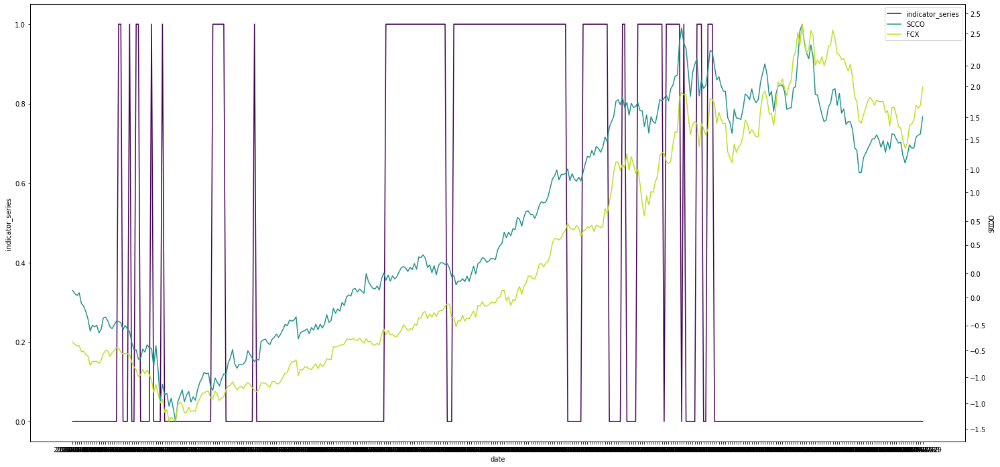

In [90]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "SCCO", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "FCX", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('SCCO', 'FCX')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="SCCO~FCX"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "SCCO", "FCX", "indicator_series")

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

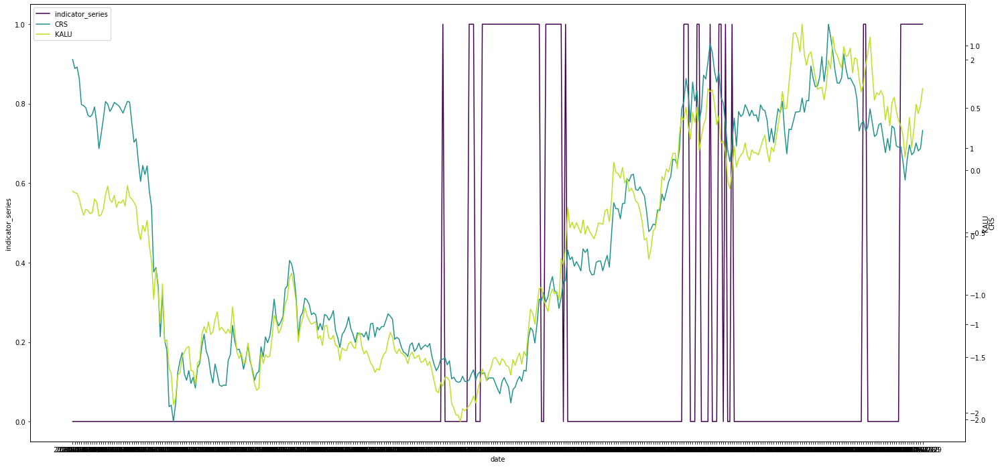

In [26]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "CRS", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "KALU", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('CRS', 'KALU')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="CRS~KALU"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "CRS", "KALU", "indicator_series")

### Other
#### KBE-KRR Pair
The SPDR® S&P® Bank ETF seeks to provide investment results that, before fees and expenses, correspond generally to the total return performance of the S&P® Banks Select Industry Index (the “Index”). The SPDR® S&P® Regional Banking ETF seeks to provide investment results that, before fees and expenses, correspond generally to the total return performance of the S&P® Regional Banks Select Industry Index (the “Index”).

#### VTV-IWD Pair
The Vanguard Value ETF seeks to track the performance of the CRSP US Large Cap Value Index, which measures the investment return of large-capitalization value stocks. The iShares Russell 1000 Value ETF seeks to track the investment results of an index composed of large- and mid-capitalization U.S. equities that exhibit value characteristics. 

#### IGV-FDN Pair
The iShares Expanded Tech-Software Sector ETF seeks to track the investment results of an index composed of North American equities in the software industry and select North American equities from interactive home entertainment and interactive media and services industries. FND is designed to measure performance of the largest and most actively traded stocks of US internet companies. The index is a composite of two sub-indices involved in internet commerce and internet services. 

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

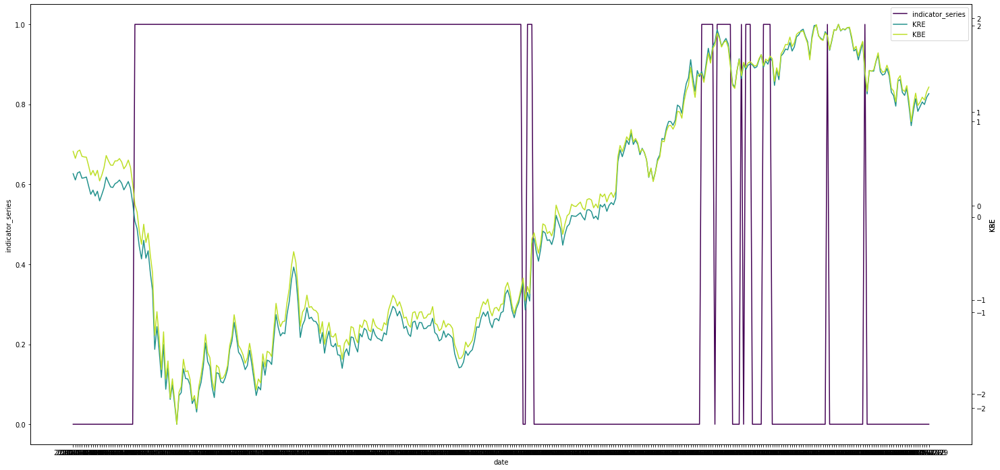

In [11]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "KRE", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "KBE", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('KRE', 'KBE')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="KRE~KBE"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "KRE", "KBE", "indicator_series")

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

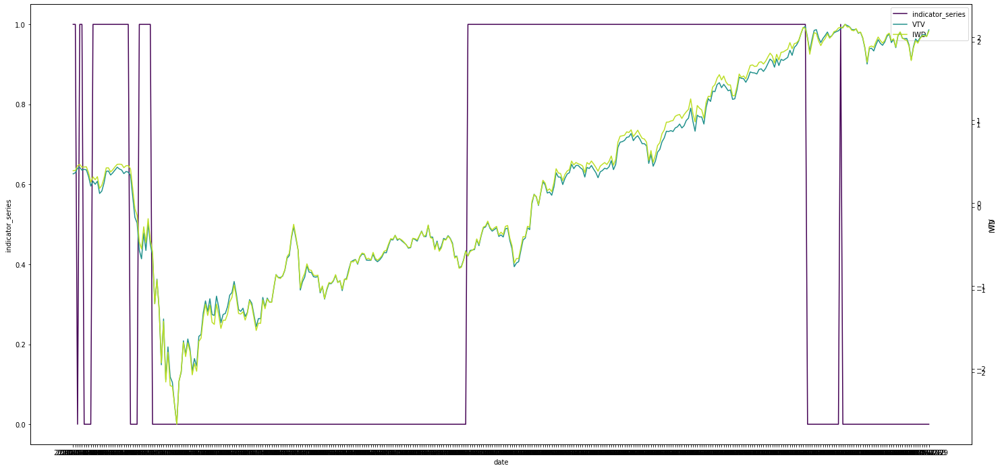

In [12]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "VTV", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "IWD", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('VTV', 'IWD')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="VTV~IWD"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "VTV", "IWD", "indicator_series")

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

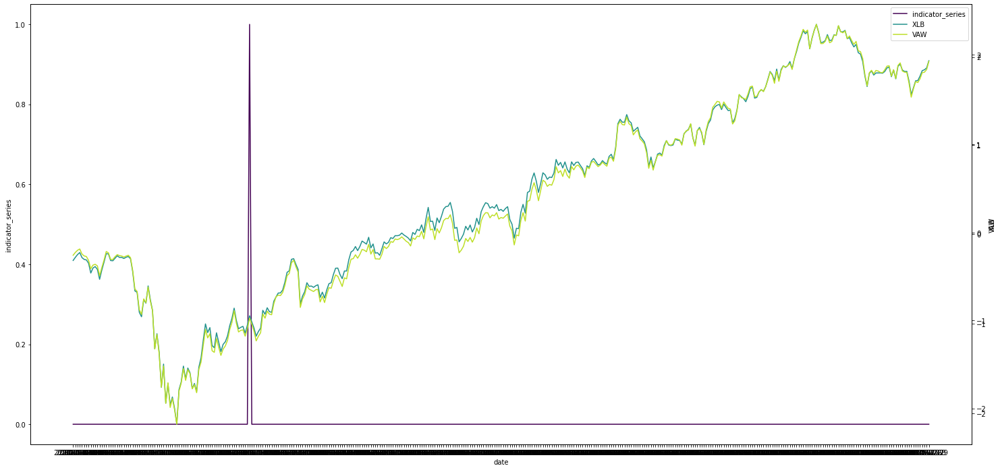

In [13]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "XLB", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "VAW", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('XLB', 'VAW')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="XLB~VAW"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "XLB", "VAW", "indicator_series")

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

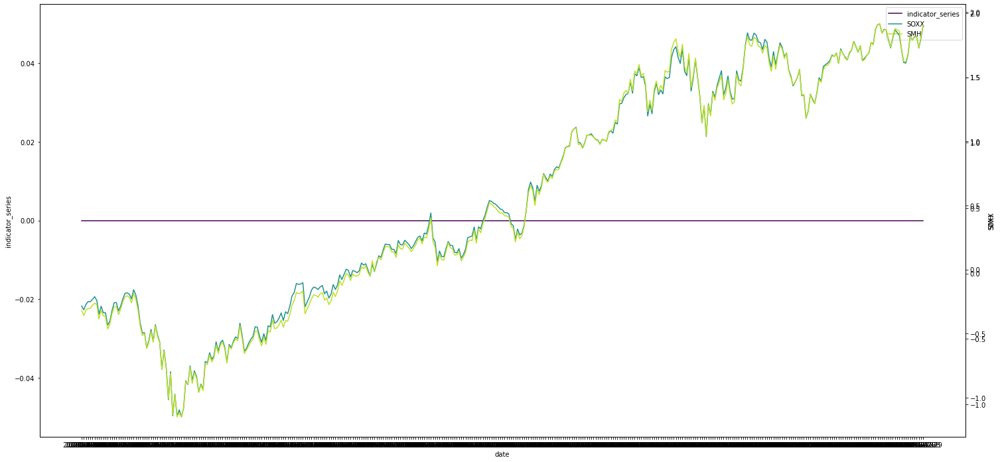

In [14]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "SOXX", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "SMH", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('SOXX', 'SMH')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="SOXX~SMH"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "SOXX", "SMH", "indicator_series")

['2019-01-02', '2019-01-03', '2019-01-04', '2019-01-07', '2019-01-08', '2019-01-09', '2019-01-10', '2019-01-11', '2019-01-14', '2019-01-15', '2019-01-16', '2019-01-17', '2019-01-18', '2019-01-22', '2019-01-23', '2019-01-24', '2019-01-25', '2019-01-28', '2019-01-29', '2019-01-30', '2019-01-31', '2019-02-01', '2019-02-04', '2019-02-05', '2019-02-06', '2019-02-07', '2019-02-08', '2019-02-11', '2019-02-12', '2019-02-13', '2019-02-14', '2019-02-15', '2019-02-19', '2019-02-20', '2019-02-21', '2019-02-22', '2019-02-25', '2019-02-26', '2019-02-27', '2019-02-28', '2019-03-01', '2019-03-04', '2019-03-05', '2019-03-06', '2019-03-07', '2019-03-08', '2019-03-11', '2019-03-12', '2019-03-13', '2019-03-14', '2019-03-15', '2019-03-18', '2019-03-19', '2019-03-20', '2019-03-21', '2019-03-22', '2019-03-25', '2019-03-26', '2019-03-27', '2019-03-28', '2019-03-29', '2019-04-01', '2019-04-02', '2019-04-03', '2019-04-04', '2019-04-05', '2019-04-08', '2019-04-09', '2019-04-10', '2019-04-11', '2019-04-12', '2019

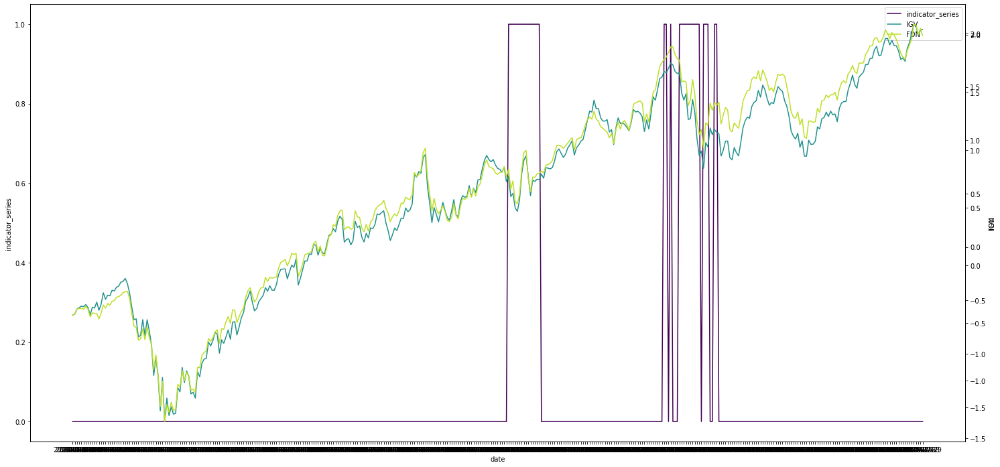

In [15]:
X = econometrics.normalize_price(econometrics.extract_time_series(df, "IGV", "5. adjusted close", "2019-01-01","2021-07-31"))
Y = econometrics.normalize_price(econometrics.extract_time_series(df, "FDN", "5. adjusted close", "2019-01-01","2021-07-31"))

results_df1, _ = econometrics.generate_coint_performance_df(df, [('IGV', 'FDN')], "2019-01-01","2021-07-31", threshold=0.1)

indicator_series = results_df1[results_df1["pair"]=="IGV~FDN"][["end_date", "is_coint"]].set_index("end_date")
plot_triple_curves(X, Y, indicator_series, "date", "price1", "price2", "IGV", "FDN", "indicator_series")

In [1]:
final_pairs = [('DHI', 'LEN'), ('CVX', 'XOM'),
 ('CSX', 'NSC'),
 ('ITT', 'PH'),
 ('LRCX', 'MKSI'),
 ('ADI', 'MCHP'), ('IP', 'WRK'),
 ('CDE', 'HL'),
 ('NUE', 'STLD'),
 ('IVV', 'SPY'),
 ('IWF', 'VUG'),
 ('RYN', 'WY'), ('NFLX', 'FB'), 
 ('LEA', 'MGA'), ('EXPE', 'BKNG'), 
 ('HRL', 'CPB'), ('OII', 'WHD'), 
 ('PTEN', 'HP'), ('GGG', 'NDSN'), 
 ('ESE', 'MWA'), ('GRC', 'MLI'), 
 ('HRI', 'WCC'), ('ON', 'NXPI'), 
 ('SCCO', 'FCX'), ('CRS', 'KALU'), 
 ('KRE', 'KBE'), ('VTV', 'IWD'), 
 ('IGV', 'FDN')]